In [1]:
import logging
import os
from PIL import Image
import six

from torch.utils.data import DataLoader

import lmdb
from tqdm.auto import tqdm

In [2]:
from cassava.utils import *
from cassava.transforms import get_test_transforms

In [3]:
unnorm = Unnormalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

In [4]:
train_images_torch_2020 = context.catalog.load('train_images_torch_2020')

2020-12-30 13:17:07,060 - kedro.io.data_catalog - INFO - Loading data from `train_images_torch_2020` (ImageOneFolderDataSet)...


In [5]:
train_images_torch_2019 = context.catalog.load('train_images_torch_2019')

2020-12-30 13:17:07,114 - kedro.io.data_catalog - INFO - Loading data from `train_images_torch_2019` (ImageFolderDataSet)...


In [6]:
test_images_torch_2019 = context.catalog.load('test_images_torch_2019')
extra_images_torch_2019 = context.catalog.load('extra_images_torch_2019')

2020-12-30 13:17:07,179 - kedro.io.data_catalog - INFO - Loading data from `test_images_torch_2019` (ImageFolderDataSet)...
2020-12-30 13:17:07,243 - kedro.io.data_catalog - INFO - Loading data from `extra_images_torch_2019` (ImageFolderDataSet)...


### 2020 sample image

(800, 600)


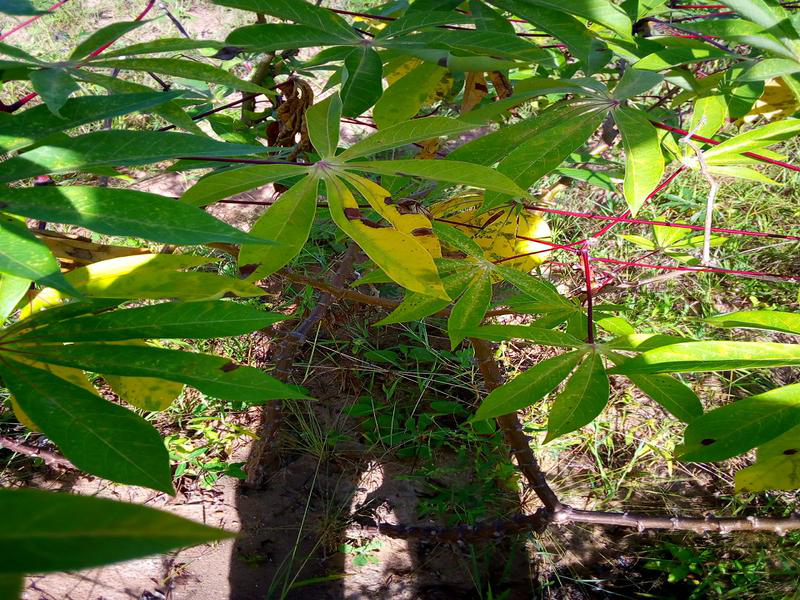

In [7]:
print(Image.fromarray(train_images_torch_2020[0][0]).size)
Image.fromarray(train_images_torch_2020[0][0])

### 2019 sample images

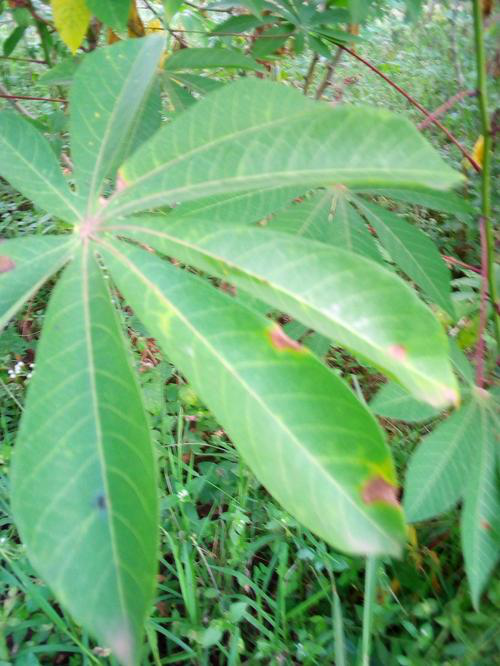

In [8]:
train_images_torch_2019[0][0]

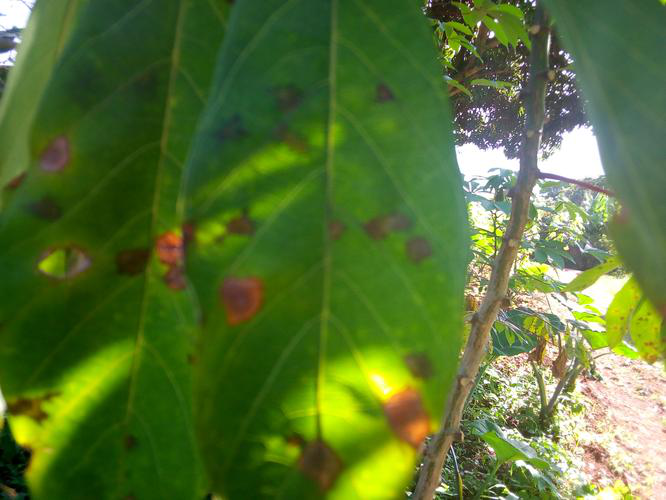

In [9]:
train_images_torch_2019[3][0]

## Applying data prepare transforms

In [10]:
from cassava.transforms import data_preapre_transform

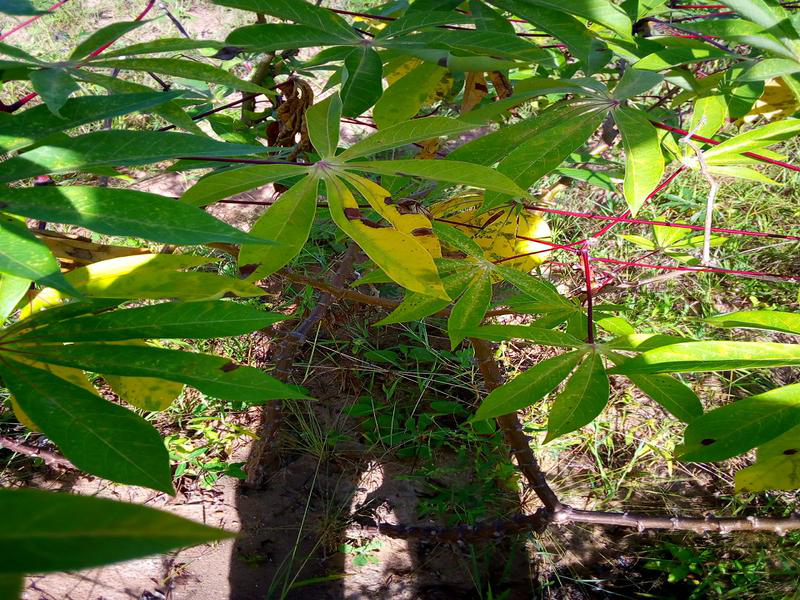

In [11]:
data_preapre_transform(train_images_torch_2020[0][0])

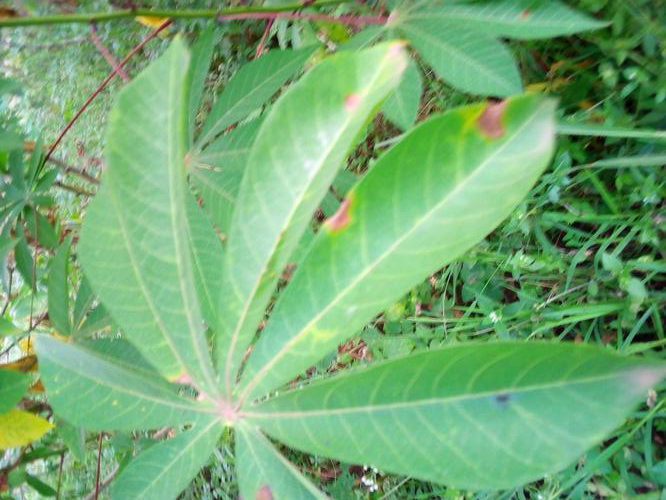

In [12]:
data_preapre_transform(train_images_torch_2019[0][0])

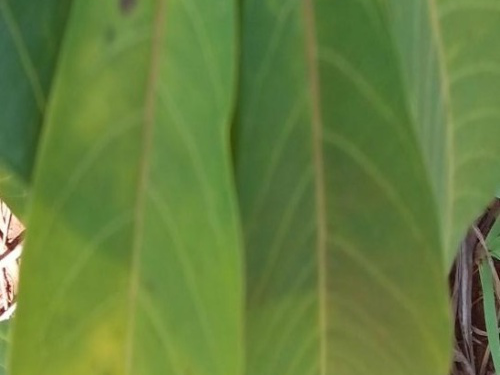

In [13]:
data_preapre_transform(train_images_torch_2019[1][0])

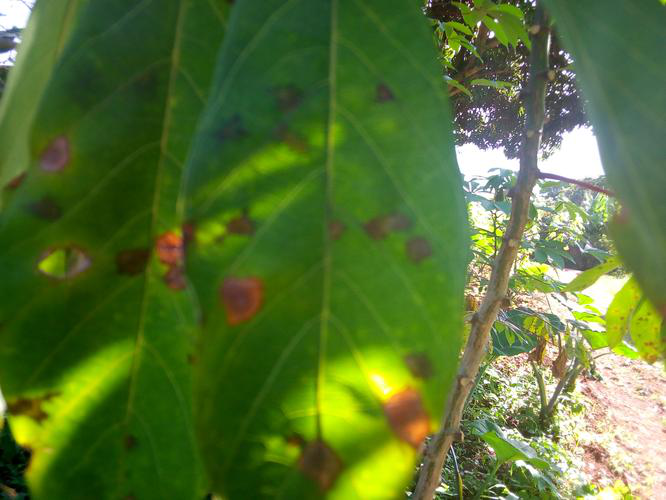

In [14]:
data_preapre_transform(train_images_torch_2019[3][0])

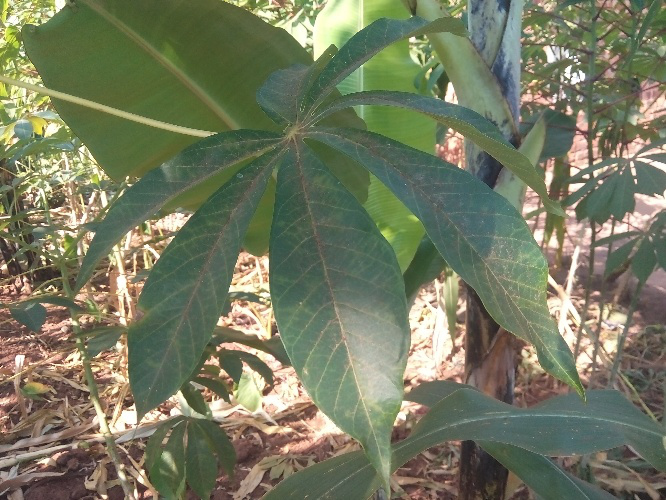

In [15]:
data_preapre_transform(test_images_torch_2019[0][0])

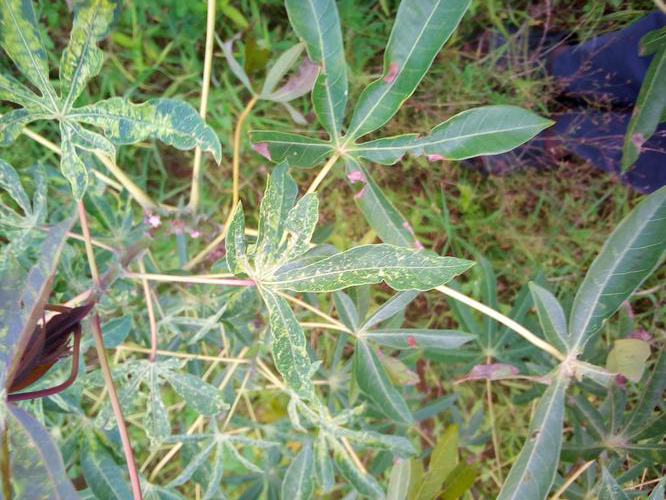

In [16]:
data_preapre_transform(extra_images_torch_2019[0][0])

### Check troubling images

In [17]:
img_idx = 24157-len(train_images_torch_2020)
img_idx

2760

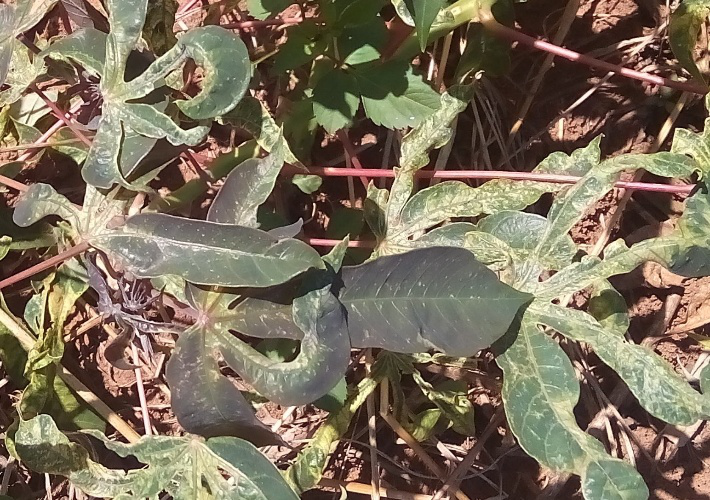

In [18]:
train_images_torch_2019[img_idx][0]

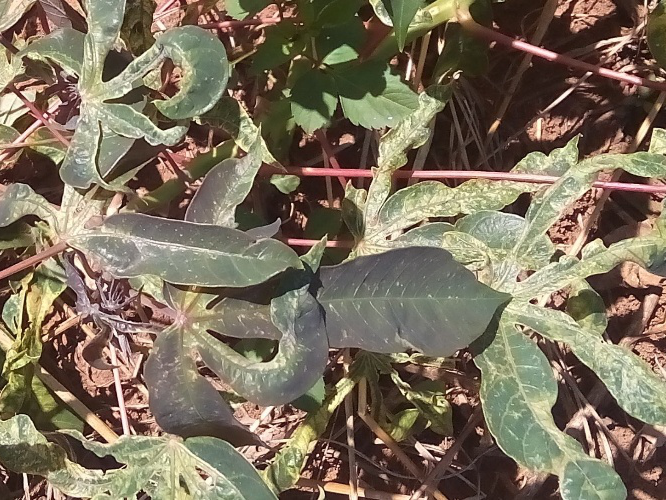

In [20]:
data_preapre_transform(train_images_torch_2019[img_idx][0])

## Check random images

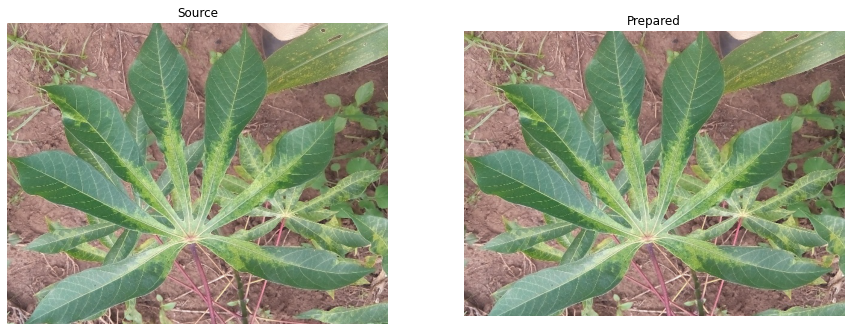

In [43]:
idx = np.random.choice(range(len(train_images_torch_2019)))

img = train_images_torch_2019[idx][0]
prepared = data_preapre_transform(img)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Source')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(prepared)
plt.title('Prepared')
plt.axis('off')
plt.show()

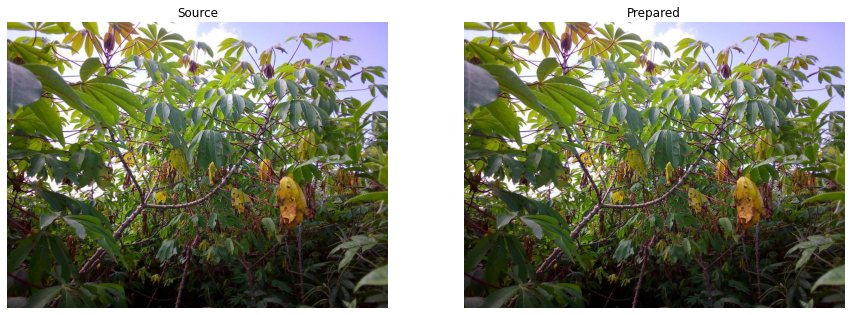

In [44]:
idx = np.random.choice(range(len(train_images_torch_2020)))

img = train_images_torch_2020[idx][0]
prepared = data_preapre_transform(img)

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Source')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(prepared)
plt.title('Prepared')
plt.axis('off')
plt.show()